# The goals / steps of this project are the following:
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

# Camera calibration

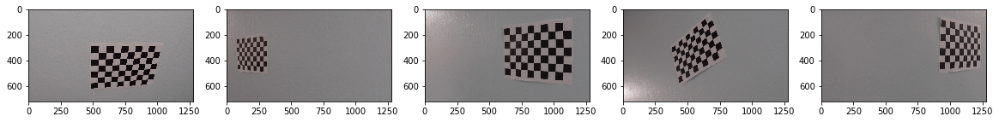

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline

from moviepy.editor import VideoFileClip
from IPython.display import HTML

# Preparing object points
nx = 9 
ny = 6 

objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

objtpoints = []
imgpoints = []
corner_images = []

# Reading a calibration images
images = glob.glob('camera_cal/*.jpg')

#Plotting the first five images
fig = plt.figure(figsize=(20, 8))
for index in range(5):
    index+=1
    readimg = cv2.imread(images[index])
    fig.add_subplot(1,5, index)
    plt.imshow(readimg)

In [2]:
for img in images:
    image = cv2.imread(img)
    gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    if ret == True:
        imgpoints.append(corners)
        objtpoints.append(objp)
        corner_images.append(cv2.drawChessboardCorners(image, (nx,ny), corners, ret))

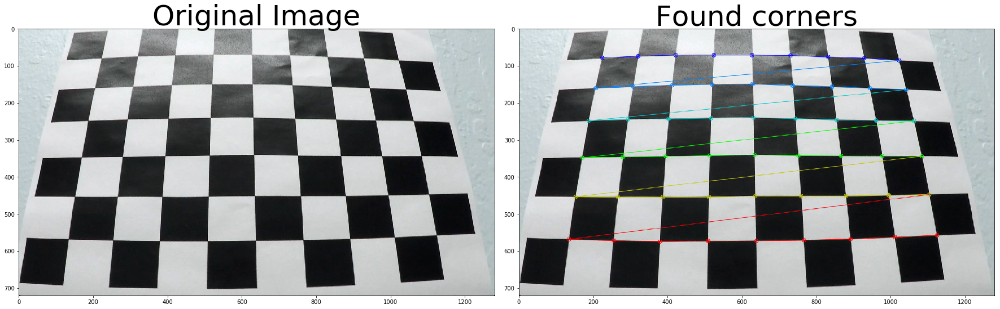

In [3]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.imread(images[13]))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(corner_images[12])
ax2.set_title('Found corners', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Image undisortion

In [4]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objtpoints, imgpoints, gray.shape[::-1], None, None)

In [5]:
def undistort(img, mtx, dist):
    
    return cv2.undistort(img, mtx, dist, None, mtx)

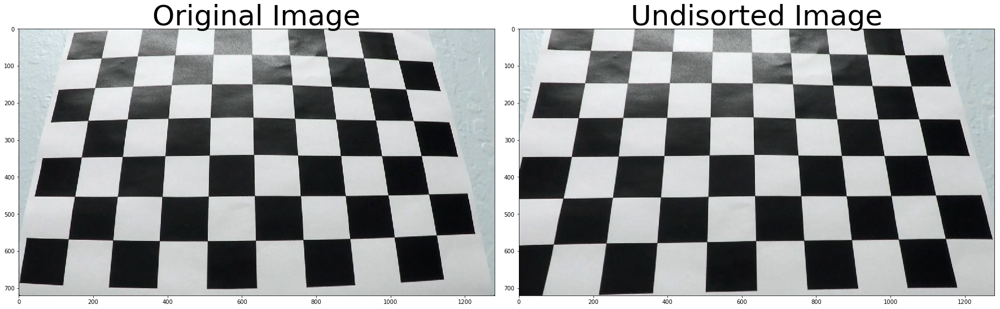

In [6]:
example_image = undistort(cv2.imread(images[13]),mtx,dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.imread(images[13]))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(example_image)
ax2.set_title('Undisorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Applying undistortion on the test image

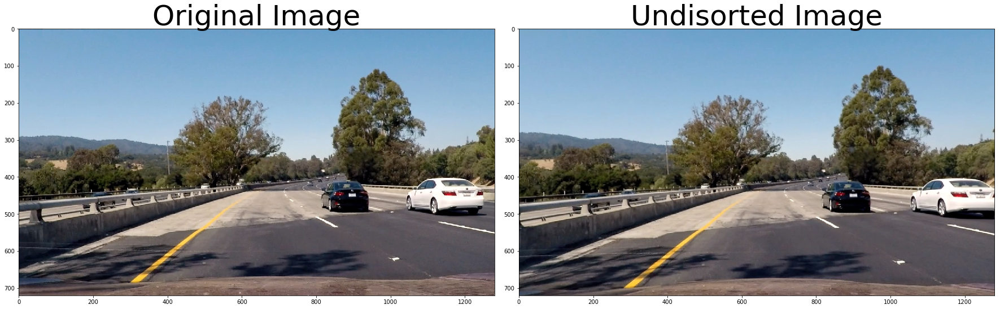

In [7]:
test_image = cv2.imread('test_images/test4.jpg')
test_image = cv2.cvtColor(test_image,cv2.COLOR_RGB2BGR)
undistored_test_image = undistort(test_image, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistored_test_image)
ax2.set_title('Undisorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Applying Sobel on the test image

In [8]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0 ,1))
        
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    return binary_output

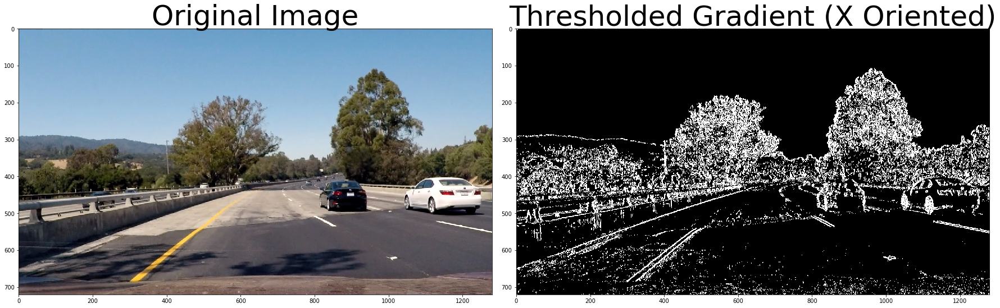

In [9]:
grad_binary_x = abs_sobel_thresh(test_image, orient='x', thresh_min=10, thresh_max=255)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary_x, cmap='gray')
ax2.set_title('Thresholded Gradient (X Oriented)', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

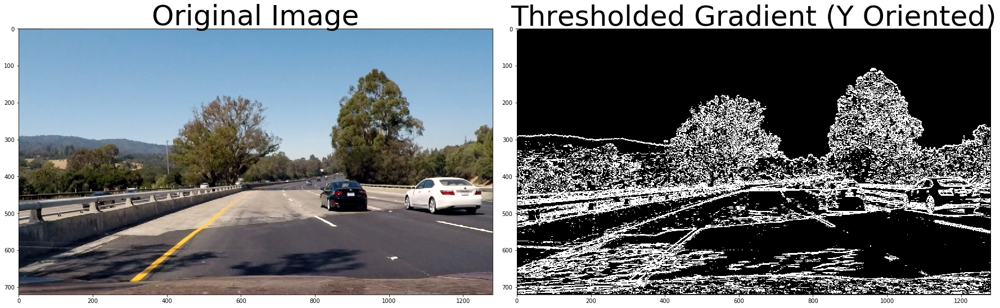

In [10]:
grad_binary_y = abs_sobel_thresh(test_image, orient='y', thresh_min=10, thresh_max=255)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary_y, cmap='gray')
ax2.set_title('Thresholded Gradient (Y Oriented)', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Applying Gradient magnitude on a test image

In [11]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
 
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 

    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    return binary_output

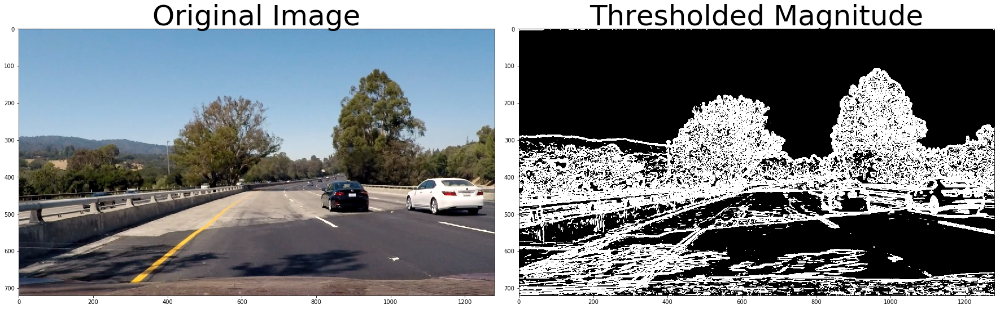

In [12]:
mag_binary = mag_thresh(test_image, sobel_kernel=7, mag_thresh=(10, 255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Applying Gradient direction on the test image

In [13]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    return binary_output

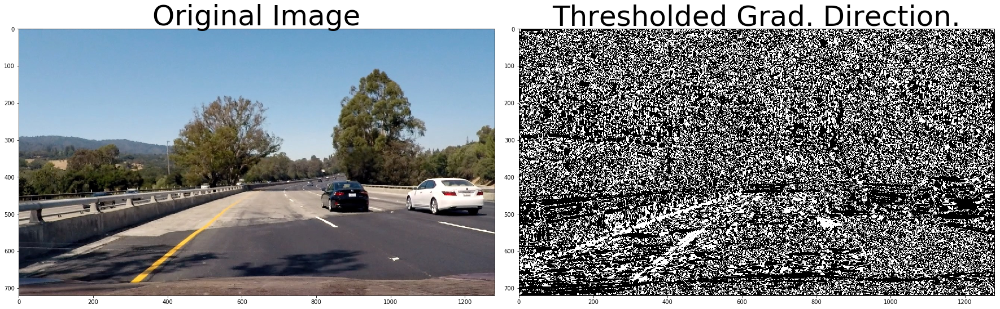

In [14]:
dir_binary = dir_threshold(test_image, sobel_kernel=15, thresh=(0.7, 1.3))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Direction.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# HLS binary image

In [15]:
def hls_select(img, thresh=(0, 255)):
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    s_channel = hls[:,:,2] # selecting the S channel
    
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    
    return binary_output

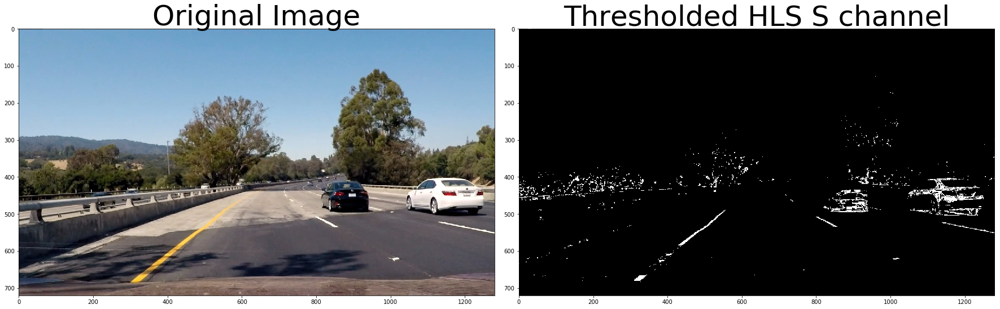

In [16]:
s_binary = hls_select(test_image, thresh=(235, 255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(s_binary, cmap='gray')
ax2.set_title('Thresholded HLS S channel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# RGB binary image

In [17]:
def rgb_select(img, thresh=(0, 255)):             
    
    b_channel = img[:,:,2] # selecting the B channel
    
    binary_output = np.zeros_like(b_channel)
    binary_output[(b_channel > thresh[0]) & (b_channel <= thresh[1])] = 1
    
    return binary_output

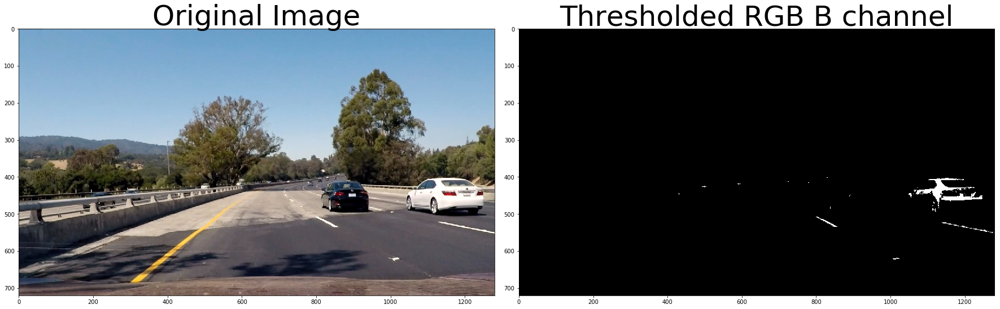

In [18]:
g_binary = rgb_select(test_image, thresh=(242, 255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(g_binary, cmap='gray')
ax2.set_title('Thresholded RGB B channel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# LUV binary image

In [19]:
def luv_select(img, thresh=(0, 255)):
    
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    
    v_channel = luv[:,:,2] # selecting the V channel
    
    binary_output = np.zeros_like(v_channel)
    binary_output[(v_channel > thresh[0]) & (v_channel <= thresh[1])] = 1
    
    return binary_output

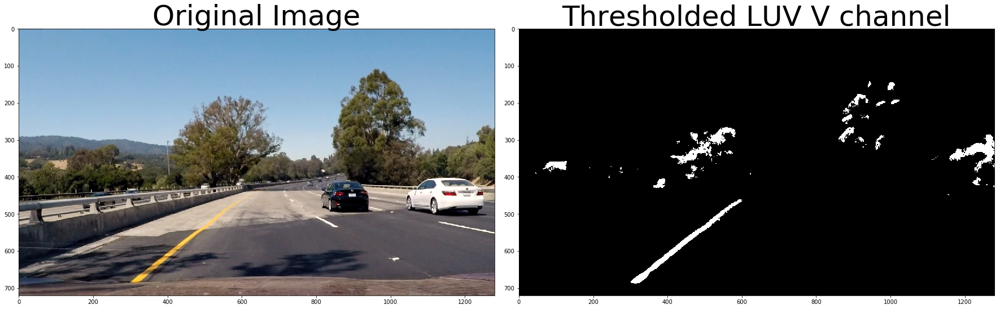

In [20]:
l_binary = luv_select(test_image, thresh=(160, 255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(l_binary, cmap='gray')
ax2.set_title('Thresholded LUV V channel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Gray binary image

In [21]:
def gray_select(img, thresh=(0, 255)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    binary_output = np.zeros_like(gray)
    binary_output[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    
    return binary_output

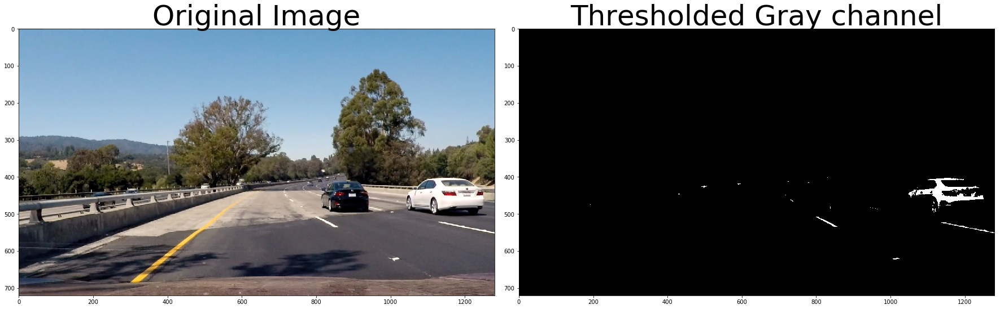

In [22]:
gray_binary = gray_select(test_image, thresh=(245, 255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(gray_binary, cmap='gray')
ax2.set_title('Thresholded Gray channel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# LAB binary image

In [23]:
def LAB_select(img, thresh=(0, 255)):
    
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    b_channel = lab[:,:,2] # selecting the B channel
    
    binary_output = np.zeros_like(b_channel)
    binary_output[(b_channel > thresh[0]) & (b_channel <= thresh[1])] = 1
    
    return binary_output

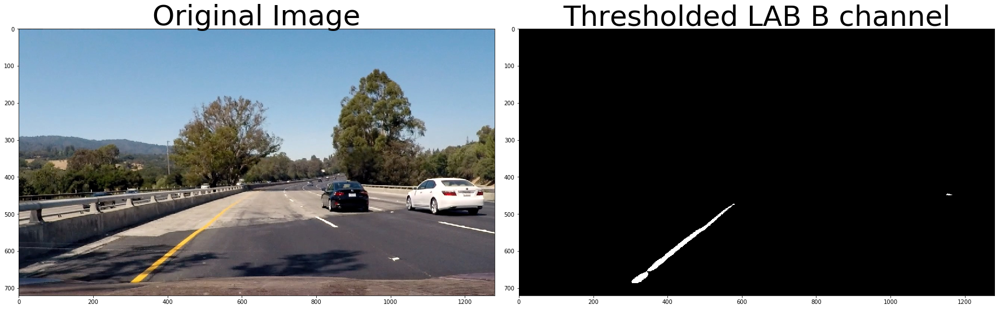

In [24]:
lab_binary = LAB_select(test_image, thresh=(160, 255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(lab_binary, cmap='gray')
ax2.set_title('Thresholded LAB B channel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Combining binary images

In [25]:
def pipeline(img):
    
    img = np.copy(img)
                     
    #Sobel
    grad_binary_x = abs_sobel_thresh(img, orient='x', thresh_min=25, thresh_max=255) # X-derivative
    grad_binary_y = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=255) # Y-derivative
    
    #Gradient
    mag_binary = mag_thresh(img, sobel_kernel=7, mag_thresh=(30, 255))  # Magnitude
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3)) # Direction
    
    #Color 
    hls_binary = hls_select(img, thresh=(190, 255))    # S channel
    rgb_binary = rgb_select(img, thresh=(242, 255))    # B channel
    luv_binary = luv_select(img, thresh=(160, 255))    # V channel
    gray_binary = gray_select(img, thresh=(200, 255))  # Gray image
    lab_binary = LAB_select(img, thresh=(160, 255))    # B channel
     
    #Combined
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    combined = np.zeros_like(img)
    
    combined[((grad_binary_x == 1)) | ( rgb_binary == 1 ) | ((lab_binary == 1) & (luv_binary == 1))] = 1 

    return combined

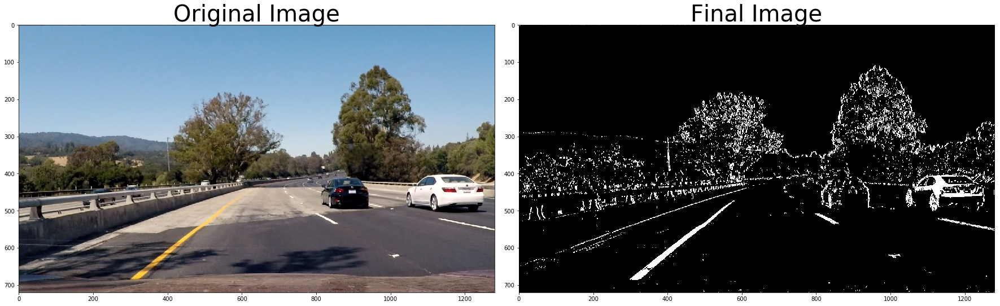

In [26]:
result = pipeline(test_image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(result,cmap='gray')
ax2.set_title('Final Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Creating Bird's-eye view binary image

In [27]:
# Region selection
img = test_image

src = np.array([[img.shape[1]/5.23, img.shape[0]/1.02],  
                [img.shape[1]/2.17, img.shape[0]/1.58],
                [img.shape[1]/1.86, img.shape[0]/1.58],
                [img.shape[1]/1.23, img.shape[0]/1.02]],
                dtype=np.float32)  

# Destination of the selected region
dst = np.array([[img.shape[1]/4,img.shape[0]],
                [img.shape[1]/4,0],
                [img.shape[1]/1.33,0],
                [img.shape[1]/1.33,img.shape[0]]],
                dtype=np.float32)

In [28]:
def img_warp(img, src, dst):

    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]))  
    
    return warped

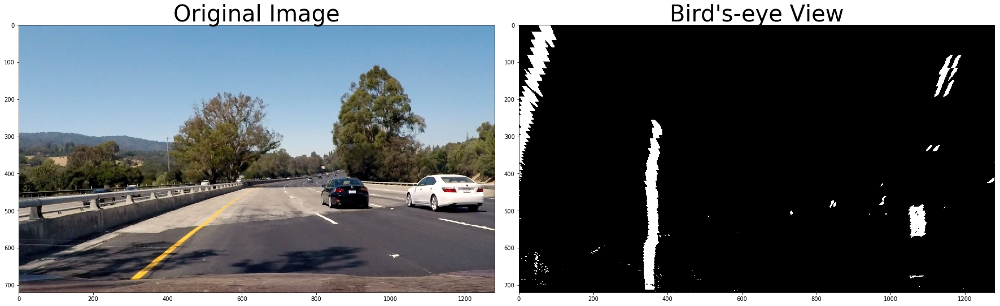

In [29]:
binary_warped = img_warp(result, src, dst)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(binary_warped,cmap='gray')
ax2.set_title("Bird's-eye View", fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Sliding Windows and Fit a Polynomial

In [30]:
def fit_polynomial(binary_warped, visualise=False):

    # Taking a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Creating an output image to draw on
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Number of sliding windows
    nwindows = 9
    
    # Height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # Identifying the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Setting the width of the windows +/- margin
    margin = 70
    
    # Setting minimum number of pixels found to recenter window
    minpix = 50
    
    # Creating empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        
        # Identifying window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Drawing the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high), (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high), (0,255,0), 2) 
        
        # Identifying the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Appending these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenating the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extracting left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fitting a second order polynomial to each  
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)    

    # Generating x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        
    if visualise==True:
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        
    else:
        return ploty, left_fitx, right_fitx

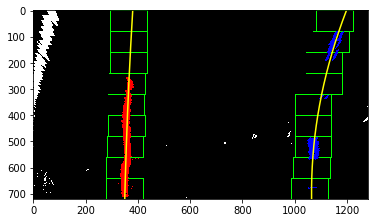

In [31]:
fit_polynomial(binary_warped, visualise = True)

# Video image creation

In [32]:
def text_layer(img, ploty, left_fitx, right_fitx):

    # Defining conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    y_eval = np.max(ploty)
    
    # Calculating the car position on the image
    car_position = ((img.shape[1])/2)* xm_per_pix
    
    # Fitting new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)

    # Calculating the radius of the curvatures
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    # Calculating the lane center
    lane_center = ((left_fitx[-1] + right_fitx[-1])/2) * xm_per_pix
 
    # Calculating the distance between the lane center and the car position
    center_distance = (lane_center - car_position)
    
    # Putting the calculated results into the image
    if(center_distance < 0):
        cv2.putText(img, 'Vehicle is ' + str(abs(round(center_distance, 3))) + ' m Left of center', (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, 
            (255,255,255), 2)  
    else:
        cv2.putText(img, 'Vehicle is ' + str(abs(round(center_distance, 3))) + ' m Right of center', (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, 
            (255,255,255), 2) 
        
    cv2.putText(img, 'Radius of Curvature = ' + str(round(0.5*(left_curverad+right_curverad), 3)) + ' m', (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, 
        (255,255,255), 2)

In [33]:
def detected_lane(image, ploty, left_fitx, right_fitx, src, dst):
       
    # Creating an image to draw on
    zero = np.zeros_like(image[:,:,0]).astype(np.uint8)
    colored_warp = np.dstack((zero, zero, zero))

    # Recasting the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Drawing the lane onto the warped blank image
    cv2.fillPoly(colored_warp, np.int_([pts]), (0, 255, 0))
    
    # Warp back the image
    rewarp = img_warp(colored_warp, dst, src)
    
    # Combining the result with the original image
    result = cv2.addWeighted(image, 1, rewarp, 0.3, 0)
    
    # Writing the Radius curvature and the Distance from lane center measuerments on the image    
    text_layer(result, ploty, left_fitx, right_fitx)
    
    return result

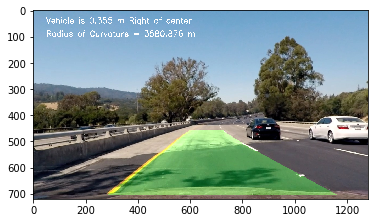

In [34]:
ploty, left_fitx, right_fitx = fit_polynomial(binary_warped, visualise=False)

output_lane = detected_lane(undistored_test_image, ploty, left_fitx, right_fitx, src, dst)
plt.imshow(output_lane)

## Final result on the video

In [35]:
def video_image(input_image):

    # Using image undistortion
    image_undistort = undistort(input_image,mtx,dist)

    # Warping the distorted image
    image_warped = img_warp(image_undistort, src, dst)
    
    # Creating an image that only shows the lane lines 
    image_binary = pipeline(image_warped)
    
    ploty, left_fitx, right_fitx = fit_polynomial(image_binary, visualise = False)
    
    # Returning the final image for the video
    return detected_lane(image_undistort, ploty, left_fitx, right_fitx, src, dst)

In [36]:
project_video_processed = "project_video_processed.mp4"
project_video = VideoFileClip("project_video.mp4")
processed_clip = project_video.fl_image(video_image)
%time processed_clip.write_videofile(project_video_processed, audio=False)

[MoviePy] >>>> Building video project_video_processed.mp4
[MoviePy] Writing video project_video_processed.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [04:45<00:00,  4.41it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_processed.mp4 

Wall time: 4min 46s


In [37]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_processed))